# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:12<00:00, 4.97KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

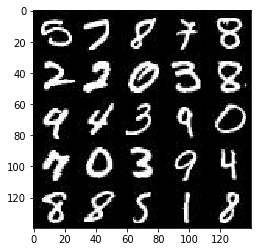

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

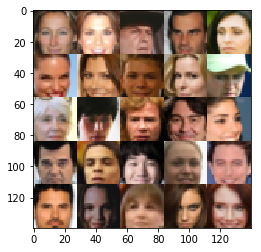

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input_images = tf.placeholder(dtype = tf.float32,
                                       shape = (None, image_width, image_height, image_channels),
                                       name = 'real_input_images')
    z_input = tf.placeholder(dtype = tf.float32, shape = (None, z_dim), name = 'z_input')
    lr = tf.placeholder(dtype = tf.float32, name = 'learning_rate')
    
    return real_input_images, z_input, lr

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False, alpha = 0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse = reuse):
        x1 = tf.layers.conv2d(images, 32, 5, strides = 2, padding = 'same', use_bias = False, activation = None)
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 64, 5, strides = 2, padding = 'same', use_bias = False, activation = None)
        bn2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 128, 5, strides = 2, padding = 'same', use_bias = False, activation = None)
        bn3 = tf.layers.batch_normalization(x3, training = True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        flat = tf.reshape(relu3, (-1, 4*4*128))
        logits = tf.layers.dense(flat, 1, activation = None)
        out = tf.sigmoid(logits)
        
    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse = not is_train):
        x1 = tf.layers.dense(z, 7*7*256, use_bias = False, activation = None)
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides = 2, padding = 'same', use_bias = False, activation = None)
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides = 2, padding = 'same', use_bias = False, activation = None)
        x3 = tf.layers.batch_normalization(x3, training = is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides = 1, padding = 'same')
        out = tf.tanh(logits)
        
    return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real, reuse = False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse = True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real, 
                                                                         labels = tf.ones_like(d_model_real)))
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, 
                                                                         labels = tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake,
                                                                    labels = tf.ones_like(d_model_fake)))

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(d_loss, var_list = d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(g_loss, var_list = g_vars)
        
    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    real_input_images, z_input, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(real_input_images, z_input, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                batch_images *= 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt,
                             feed_dict={real_input_images: batch_images, z_input: batch_z, lr: learning_rate})
                _ = sess.run(g_opt,
                             feed_dict={real_input_images: batch_images, z_input: batch_z, lr: learning_rate})

                if steps % 100 == 0:
                    train_loss_d = d_loss.eval({real_input_images: batch_images, z_input: batch_z})
                    train_loss_g = g_loss.eval({real_input_images: batch_images, z_input: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    show_generator_output(sess, 25, z_input, data_shape[3], data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.4152... Generator Loss: 0.5150


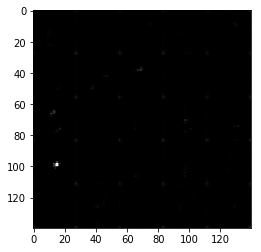

Epoch 1/2... Discriminator Loss: 1.6321... Generator Loss: 0.3505


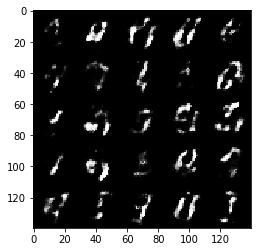

Epoch 1/2... Discriminator Loss: 1.7602... Generator Loss: 0.3113


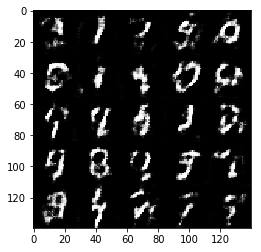

Epoch 1/2... Discriminator Loss: 1.3084... Generator Loss: 0.5840


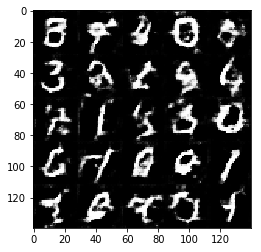

Epoch 1/2... Discriminator Loss: 1.3848... Generator Loss: 0.5322


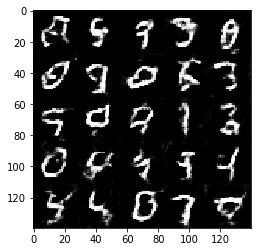

Epoch 1/2... Discriminator Loss: 1.3547... Generator Loss: 0.8300


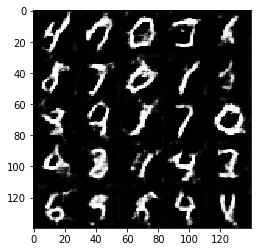

Epoch 1/2... Discriminator Loss: 1.6564... Generator Loss: 0.2823


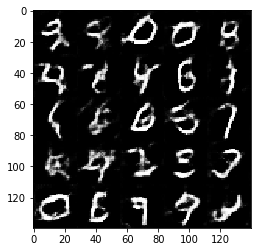

Epoch 1/2... Discriminator Loss: 1.0400... Generator Loss: 0.8119


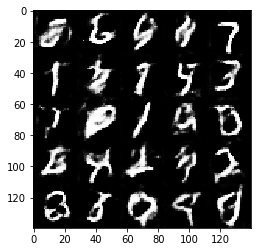

Epoch 1/2... Discriminator Loss: 1.4646... Generator Loss: 0.4992


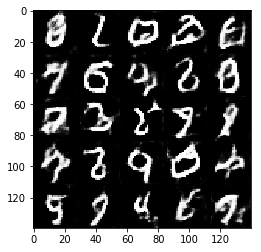

Epoch 1/2... Discriminator Loss: 1.3332... Generator Loss: 0.4348


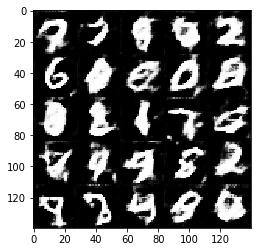

Epoch 1/2... Discriminator Loss: 1.1163... Generator Loss: 0.6981


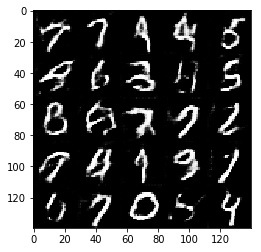

Epoch 1/2... Discriminator Loss: 1.7714... Generator Loss: 0.2835


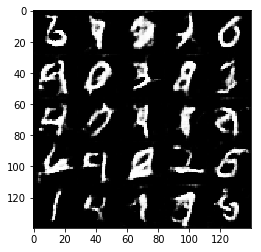

Epoch 1/2... Discriminator Loss: 1.3017... Generator Loss: 0.4747


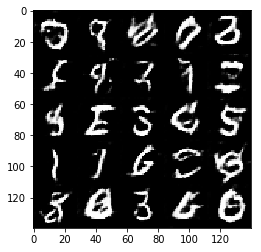

Epoch 1/2... Discriminator Loss: 1.5645... Generator Loss: 0.3491


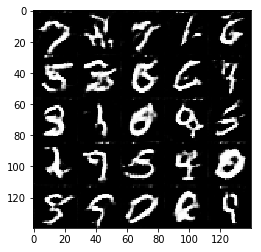

Epoch 1/2... Discriminator Loss: 1.2847... Generator Loss: 1.4470


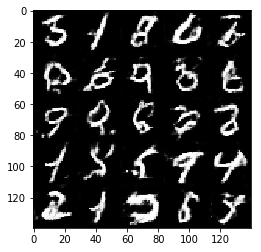

Epoch 1/2... Discriminator Loss: 0.6241... Generator Loss: 1.6756


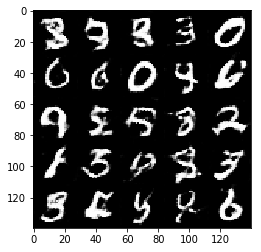

Epoch 1/2... Discriminator Loss: 1.0193... Generator Loss: 0.6022


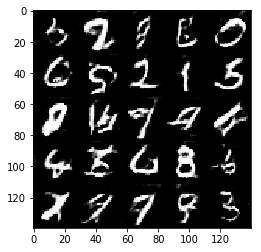

Epoch 1/2... Discriminator Loss: 1.2180... Generator Loss: 0.5388


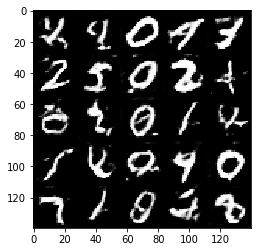

Epoch 1/2... Discriminator Loss: 1.1937... Generator Loss: 0.6899


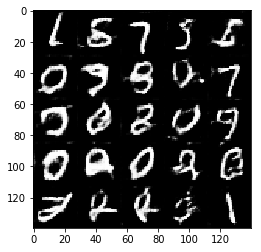

Epoch 1/2... Discriminator Loss: 0.9104... Generator Loss: 0.8922


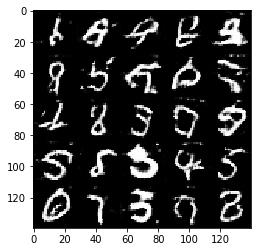

Epoch 1/2... Discriminator Loss: 0.9845... Generator Loss: 0.5893


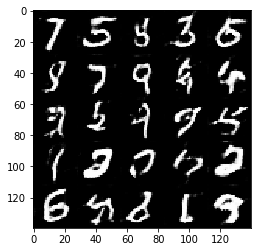

Epoch 1/2... Discriminator Loss: 0.9481... Generator Loss: 0.9080


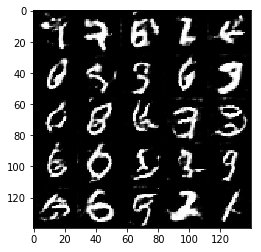

Epoch 1/2... Discriminator Loss: 0.8078... Generator Loss: 0.9858


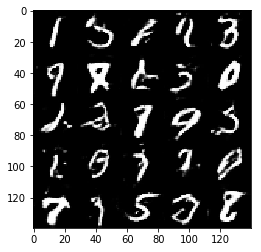

Epoch 1/2... Discriminator Loss: 1.3253... Generator Loss: 0.5013


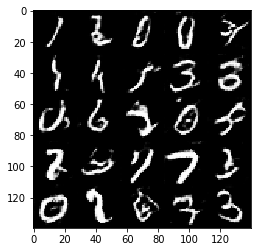

Epoch 1/2... Discriminator Loss: 1.2153... Generator Loss: 0.5256


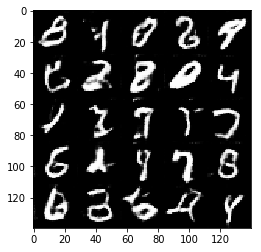

Epoch 1/2... Discriminator Loss: 0.9133... Generator Loss: 0.7340


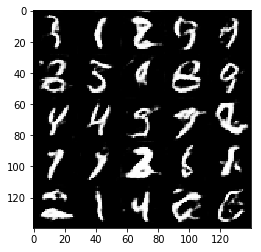

Epoch 1/2... Discriminator Loss: 0.4009... Generator Loss: 1.8789


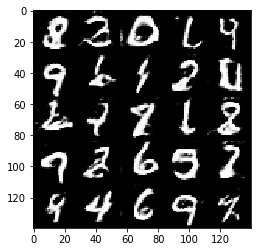

Epoch 1/2... Discriminator Loss: 0.6982... Generator Loss: 1.5093


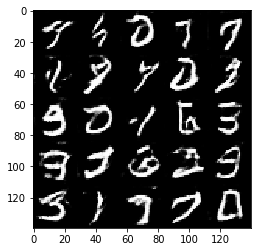

Epoch 1/2... Discriminator Loss: 0.4580... Generator Loss: 1.9532


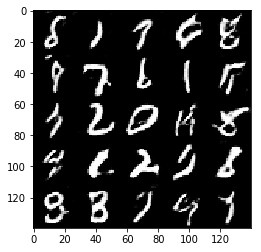

Epoch 1/2... Discriminator Loss: 1.7574... Generator Loss: 0.3037


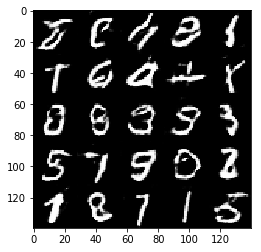

Epoch 1/2... Discriminator Loss: 1.2919... Generator Loss: 0.4849


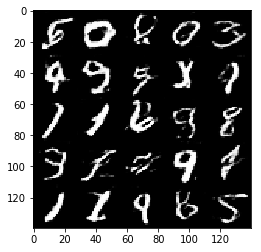

Epoch 1/2... Discriminator Loss: 1.0975... Generator Loss: 0.5522


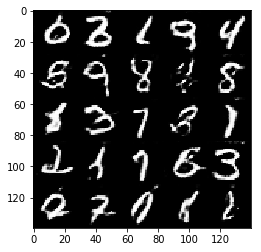

Epoch 1/2... Discriminator Loss: 0.3553... Generator Loss: 1.5686


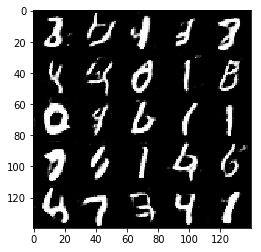

Epoch 1/2... Discriminator Loss: 0.5406... Generator Loss: 1.5798


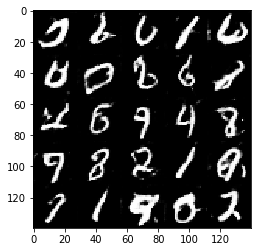

Epoch 1/2... Discriminator Loss: 0.7128... Generator Loss: 1.2893


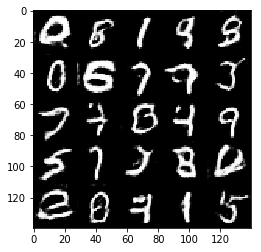

Epoch 1/2... Discriminator Loss: 0.6587... Generator Loss: 1.0149


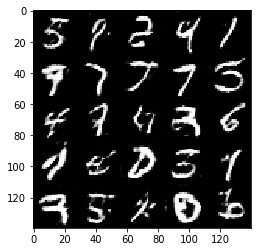

Epoch 1/2... Discriminator Loss: 0.4242... Generator Loss: 1.7363


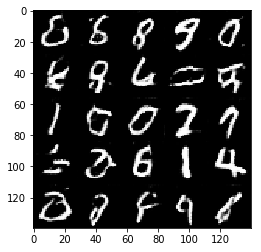

Epoch 2/2... Discriminator Loss: 0.4279... Generator Loss: 1.8114


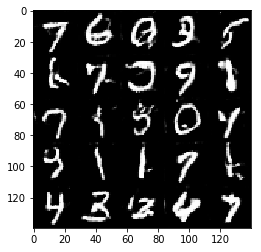

Epoch 2/2... Discriminator Loss: 0.8650... Generator Loss: 0.8600


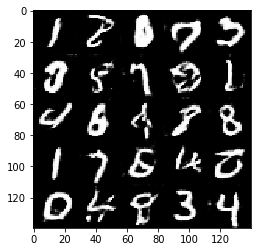

Epoch 2/2... Discriminator Loss: 1.2746... Generator Loss: 0.4222


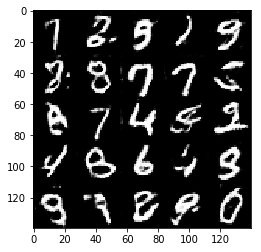

Epoch 2/2... Discriminator Loss: 0.8760... Generator Loss: 0.7124


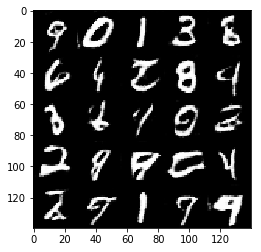

Epoch 2/2... Discriminator Loss: 0.3284... Generator Loss: 1.7603


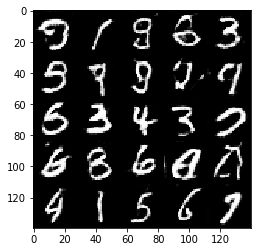

Epoch 2/2... Discriminator Loss: 0.8288... Generator Loss: 0.9138


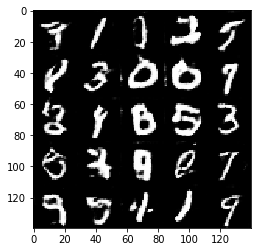

Epoch 2/2... Discriminator Loss: 0.4570... Generator Loss: 1.5462


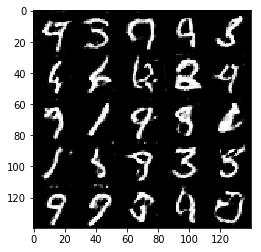

Epoch 2/2... Discriminator Loss: 0.4927... Generator Loss: 1.6593


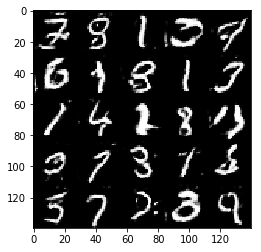

Epoch 2/2... Discriminator Loss: 0.9076... Generator Loss: 0.6373


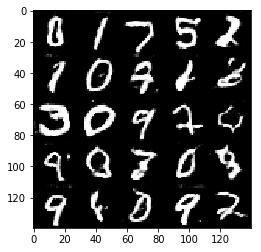

Epoch 2/2... Discriminator Loss: 0.5860... Generator Loss: 1.2301


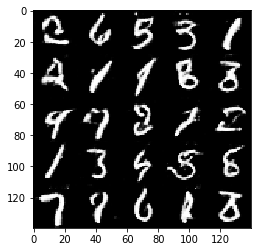

Epoch 2/2... Discriminator Loss: 0.7214... Generator Loss: 1.2623


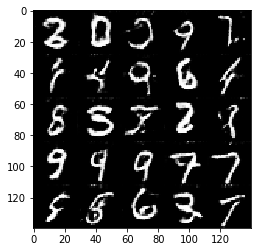

Epoch 2/2... Discriminator Loss: 0.5107... Generator Loss: 1.2914


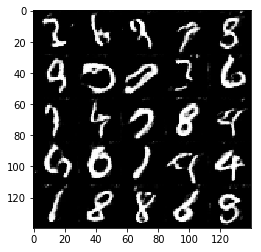

Epoch 2/2... Discriminator Loss: 0.8413... Generator Loss: 0.9865


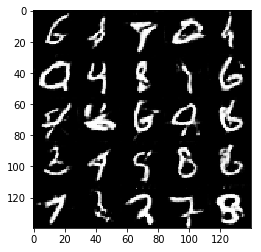

Epoch 2/2... Discriminator Loss: 0.3757... Generator Loss: 1.7316


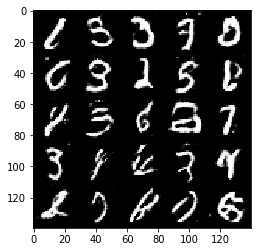

Epoch 2/2... Discriminator Loss: 0.5415... Generator Loss: 1.2261


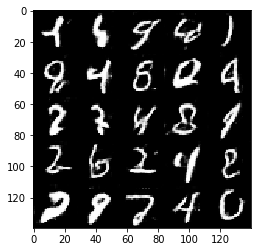

Epoch 2/2... Discriminator Loss: 1.4961... Generator Loss: 0.3987


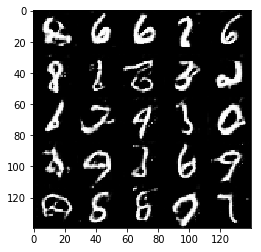

Epoch 2/2... Discriminator Loss: 0.9083... Generator Loss: 0.7574


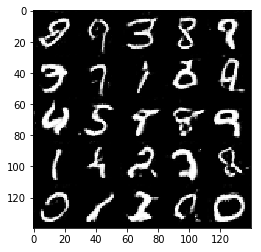

Epoch 2/2... Discriminator Loss: 0.7377... Generator Loss: 0.8677


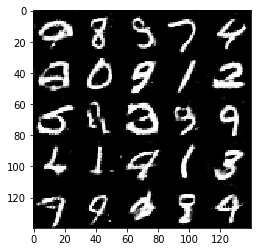

Epoch 2/2... Discriminator Loss: 1.2339... Generator Loss: 1.1053


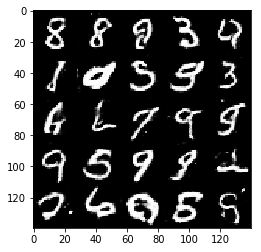

Epoch 2/2... Discriminator Loss: 0.5463... Generator Loss: 1.9145


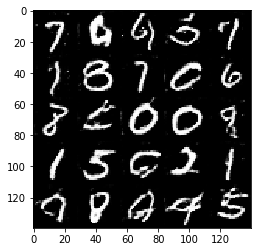

Epoch 2/2... Discriminator Loss: 1.2132... Generator Loss: 0.5739


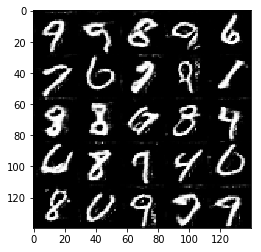

Epoch 2/2... Discriminator Loss: 0.9957... Generator Loss: 0.6614


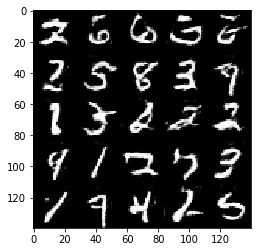

Epoch 2/2... Discriminator Loss: 0.6813... Generator Loss: 0.9864


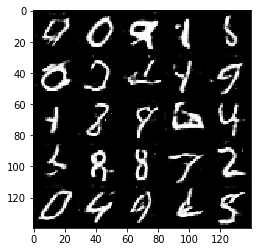

Epoch 2/2... Discriminator Loss: 0.4934... Generator Loss: 1.4787


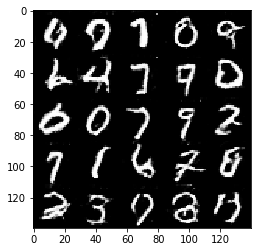

Epoch 2/2... Discriminator Loss: 0.5557... Generator Loss: 1.6245


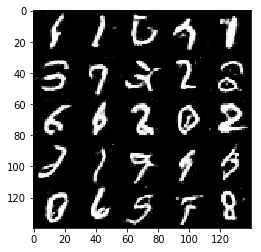

Epoch 2/2... Discriminator Loss: 0.8177... Generator Loss: 0.8432


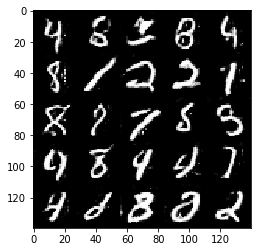

Epoch 2/2... Discriminator Loss: 0.4856... Generator Loss: 2.5644


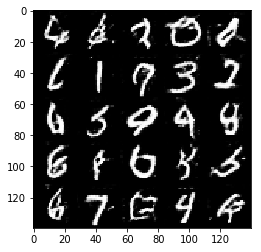

Epoch 2/2... Discriminator Loss: 0.3945... Generator Loss: 3.4535


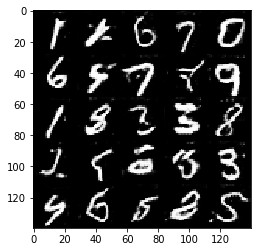

Epoch 2/2... Discriminator Loss: 1.1026... Generator Loss: 0.5377


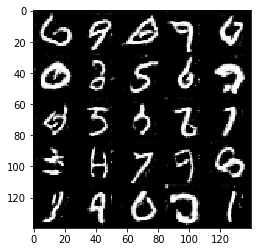

Epoch 2/2... Discriminator Loss: 1.2347... Generator Loss: 0.6079


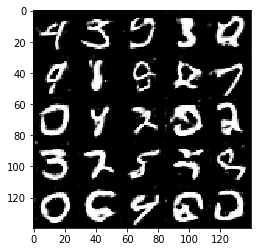

Epoch 2/2... Discriminator Loss: 0.4906... Generator Loss: 1.4055


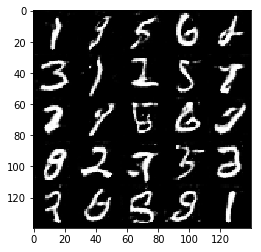

Epoch 2/2... Discriminator Loss: 0.6597... Generator Loss: 0.9547


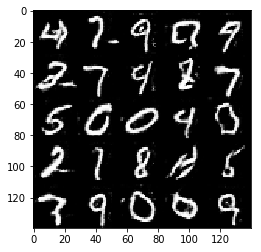

Epoch 2/2... Discriminator Loss: 1.2892... Generator Loss: 0.8306


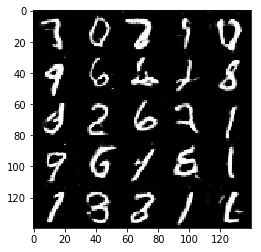

Epoch 2/2... Discriminator Loss: 0.4034... Generator Loss: 2.9371


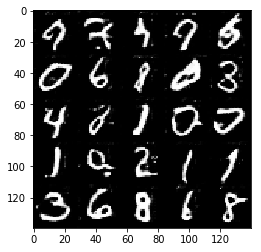

Epoch 2/2... Discriminator Loss: 0.4028... Generator Loss: 1.9506


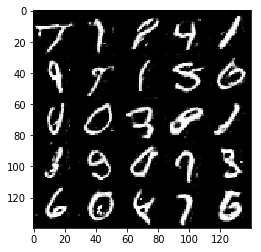

Epoch 2/2... Discriminator Loss: 2.0187... Generator Loss: 0.2405


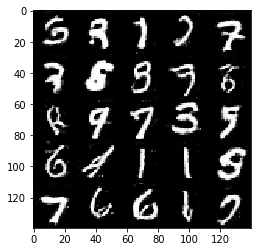

Epoch 2/2... Discriminator Loss: 0.8327... Generator Loss: 1.7721


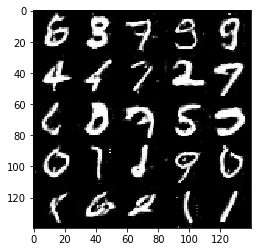

Epoch 2/2... Discriminator Loss: 0.5414... Generator Loss: 1.3445


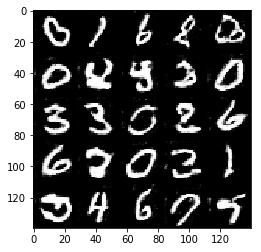

In [19]:
batch_size = 16
z_dim = 128
learning_rate = 0.0008
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.0831... Generator Loss: 0.2571


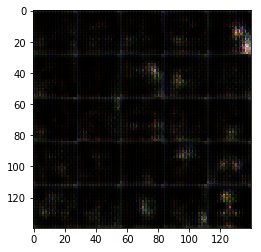

Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 0.3877


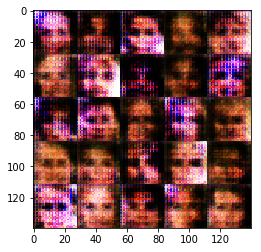

Epoch 1/1... Discriminator Loss: 2.0597... Generator Loss: 0.2285


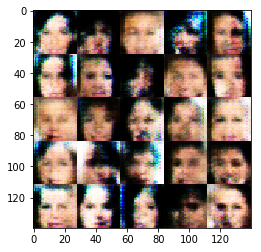

Epoch 1/1... Discriminator Loss: 0.9689... Generator Loss: 1.2690


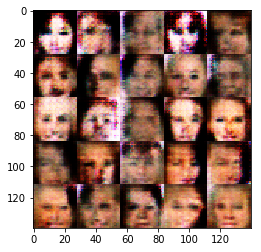

Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.9392


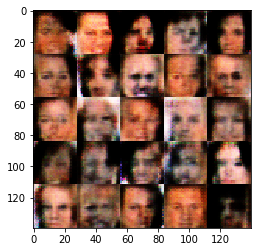

Epoch 1/1... Discriminator Loss: 1.6371... Generator Loss: 0.4483


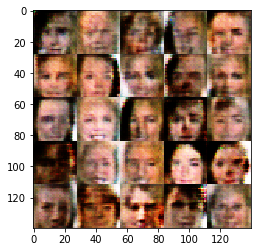

Epoch 1/1... Discriminator Loss: 1.8351... Generator Loss: 0.2386


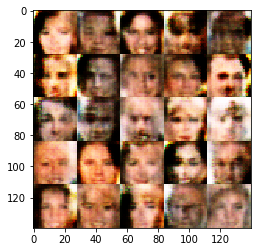

Epoch 1/1... Discriminator Loss: 1.5636... Generator Loss: 0.6486


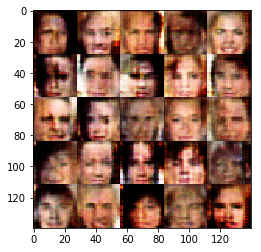

Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.8002


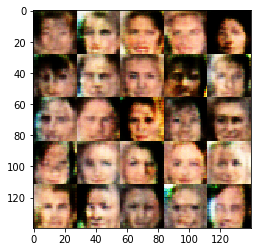

Epoch 1/1... Discriminator Loss: 1.4292... Generator Loss: 0.5848


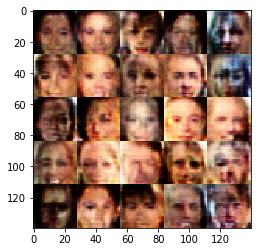

Epoch 1/1... Discriminator Loss: 1.6316... Generator Loss: 0.4704


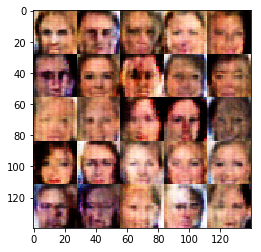

Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.4915


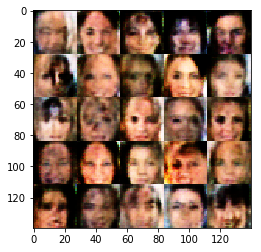

Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.4688


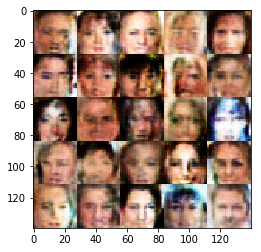

Epoch 1/1... Discriminator Loss: 1.3512... Generator Loss: 0.6006


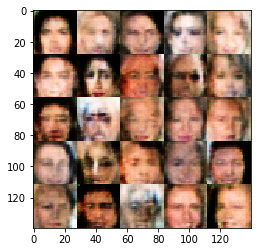

Epoch 1/1... Discriminator Loss: 1.5150... Generator Loss: 0.4005


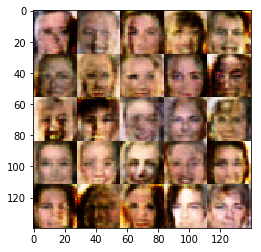

Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.6315


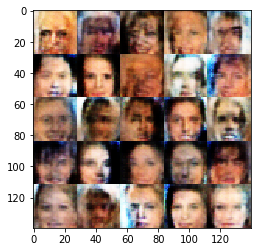

Epoch 1/1... Discriminator Loss: 1.6071... Generator Loss: 0.3896


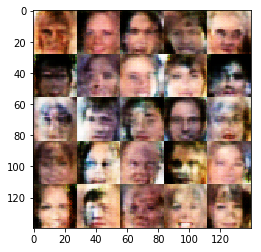

Epoch 1/1... Discriminator Loss: 1.2117... Generator Loss: 0.6731


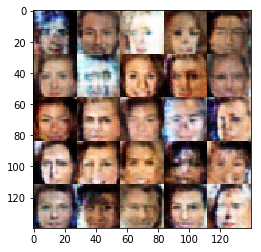

Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.5716


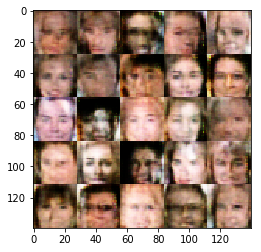

Epoch 1/1... Discriminator Loss: 1.2852... Generator Loss: 0.7689


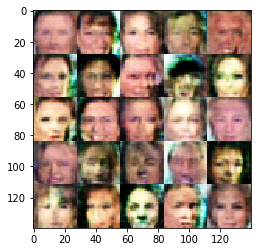

Epoch 1/1... Discriminator Loss: 1.4361... Generator Loss: 0.5142


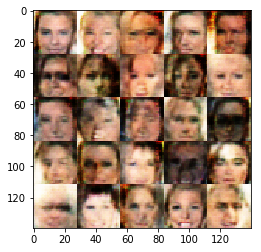

Epoch 1/1... Discriminator Loss: 1.4746... Generator Loss: 0.5515


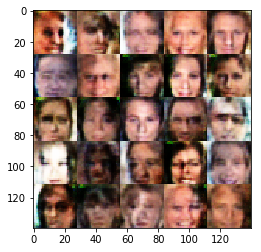

Epoch 1/1... Discriminator Loss: 1.3089... Generator Loss: 0.6663


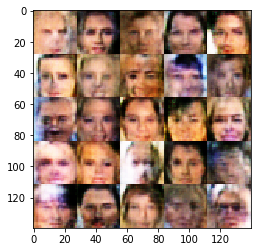

Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.7233


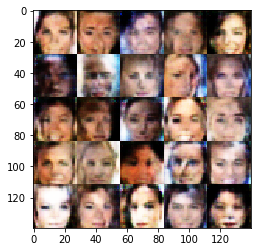

Epoch 1/1... Discriminator Loss: 1.6024... Generator Loss: 0.3709


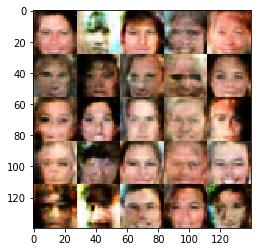

Epoch 1/1... Discriminator Loss: 1.4170... Generator Loss: 0.5955


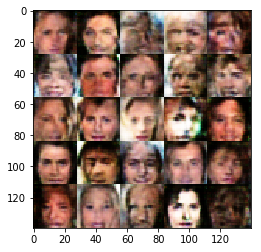

Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.5684


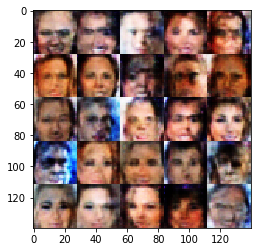

Epoch 1/1... Discriminator Loss: 1.6024... Generator Loss: 0.4910


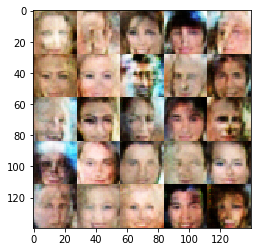

Epoch 1/1... Discriminator Loss: 1.5477... Generator Loss: 0.4217


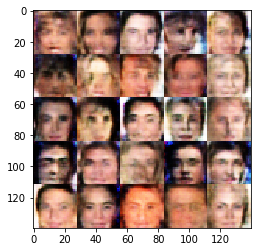

Epoch 1/1... Discriminator Loss: 1.5115... Generator Loss: 0.3681


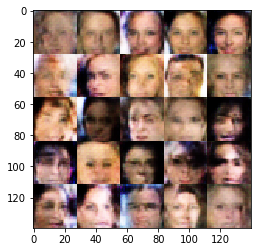

Epoch 1/1... Discriminator Loss: 1.4940... Generator Loss: 0.5208


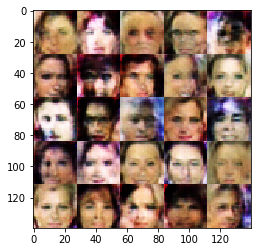

Epoch 1/1... Discriminator Loss: 1.3485... Generator Loss: 0.5727


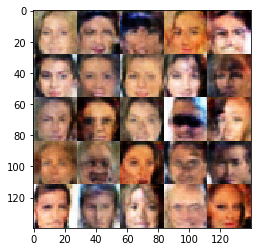

Epoch 1/1... Discriminator Loss: 1.5018... Generator Loss: 0.6811


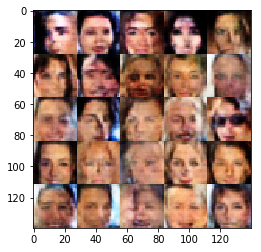

Epoch 1/1... Discriminator Loss: 1.3585... Generator Loss: 0.5275


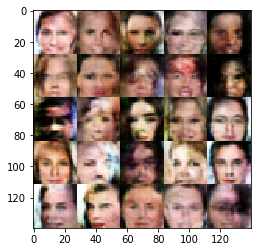

Epoch 1/1... Discriminator Loss: 1.5465... Generator Loss: 0.5034


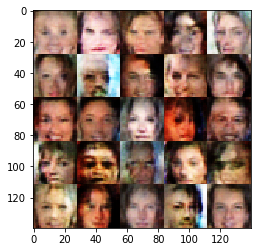

Epoch 1/1... Discriminator Loss: 1.4630... Generator Loss: 0.4836


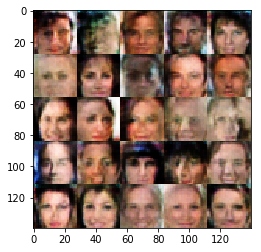

Epoch 1/1... Discriminator Loss: 1.2867... Generator Loss: 0.4336


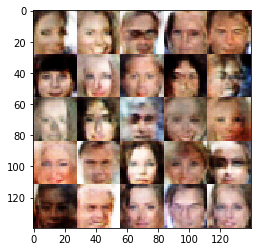

Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.4737


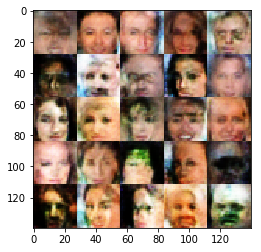

Epoch 1/1... Discriminator Loss: 1.3549... Generator Loss: 0.5348


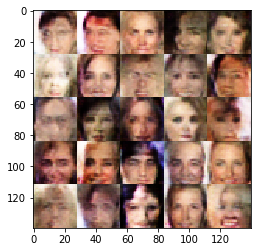

Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.4545


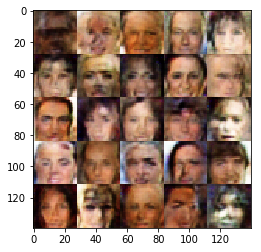

Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.6335


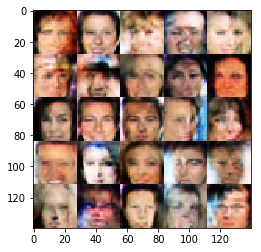

Epoch 1/1... Discriminator Loss: 1.2664... Generator Loss: 0.5650


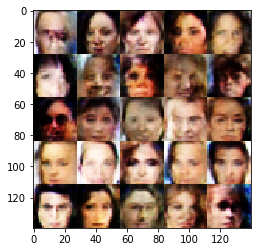

Epoch 1/1... Discriminator Loss: 1.5175... Generator Loss: 0.6297


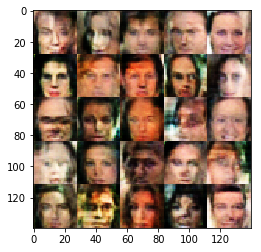

Epoch 1/1... Discriminator Loss: 1.4344... Generator Loss: 0.5491


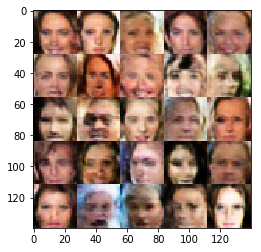

Epoch 1/1... Discriminator Loss: 1.5867... Generator Loss: 0.4157


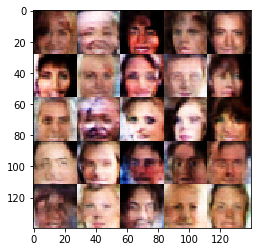

Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.6283


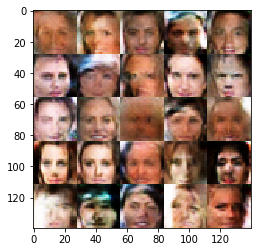

Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.6090


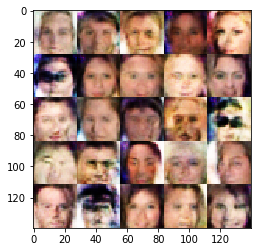

Epoch 1/1... Discriminator Loss: 1.5146... Generator Loss: 0.5186


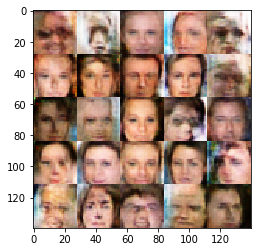

Epoch 1/1... Discriminator Loss: 1.4615... Generator Loss: 0.5334


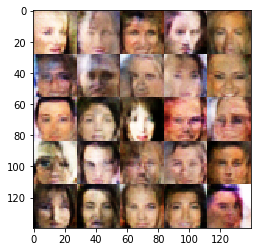

Epoch 1/1... Discriminator Loss: 1.4671... Generator Loss: 0.6072


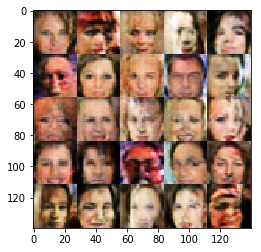

Epoch 1/1... Discriminator Loss: 1.5003... Generator Loss: 0.5200


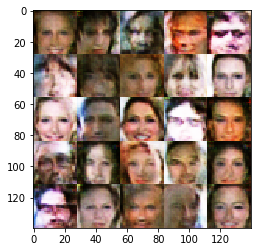

Epoch 1/1... Discriminator Loss: 1.2981... Generator Loss: 0.6039


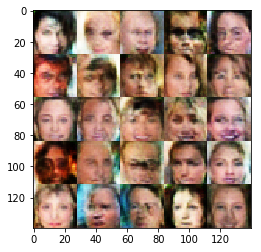

Epoch 1/1... Discriminator Loss: 1.4819... Generator Loss: 0.5151


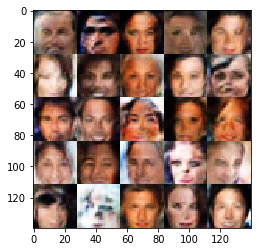

Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.5654


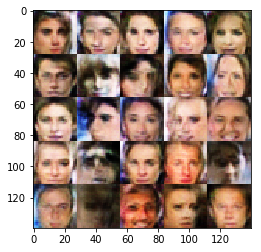

Epoch 1/1... Discriminator Loss: 1.4930... Generator Loss: 0.4630


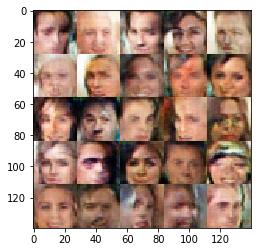

Epoch 1/1... Discriminator Loss: 1.2393... Generator Loss: 0.7124


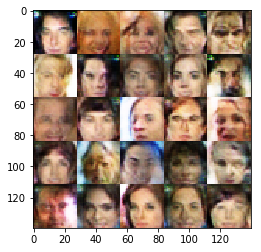

Epoch 1/1... Discriminator Loss: 1.3310... Generator Loss: 0.6299


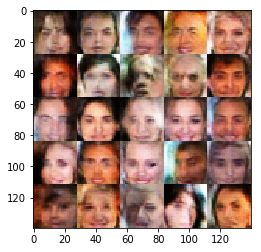

Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 0.6283


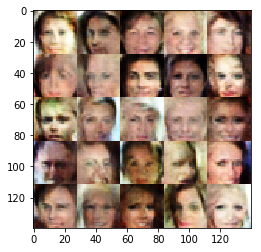

Epoch 1/1... Discriminator Loss: 1.0131... Generator Loss: 0.7692


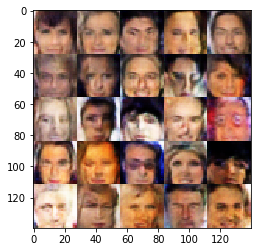

Epoch 1/1... Discriminator Loss: 1.2365... Generator Loss: 0.6144


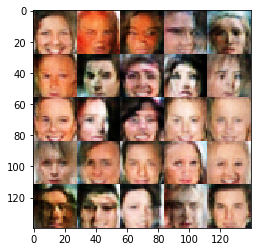

Epoch 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.5754


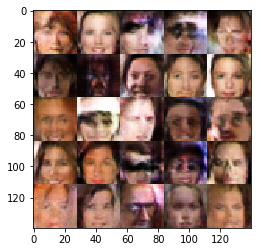

Epoch 1/1... Discriminator Loss: 1.6552... Generator Loss: 0.4334


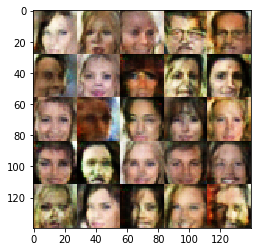

Epoch 1/1... Discriminator Loss: 1.5055... Generator Loss: 0.5436


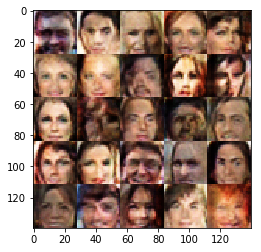

Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.6945


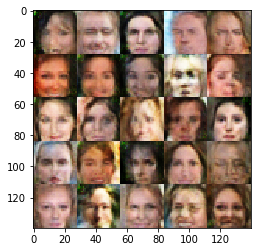

Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.4928


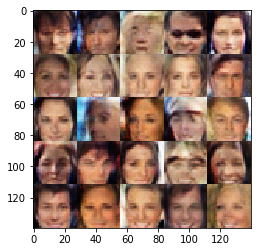

Epoch 1/1... Discriminator Loss: 1.8925... Generator Loss: 0.3360


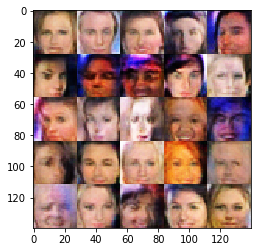

Epoch 1/1... Discriminator Loss: 1.2596... Generator Loss: 0.6351


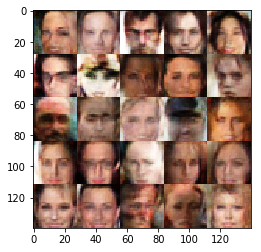

Epoch 1/1... Discriminator Loss: 1.4778... Generator Loss: 0.5869


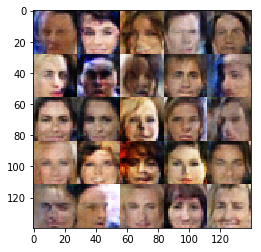

Epoch 1/1... Discriminator Loss: 1.5865... Generator Loss: 0.4899


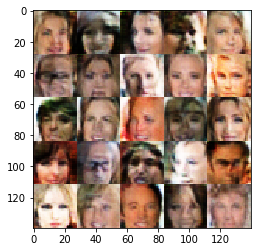

Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.6306


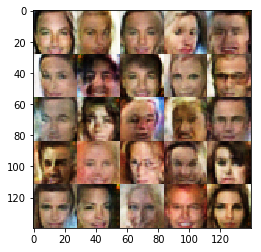

Epoch 1/1... Discriminator Loss: 1.3334... Generator Loss: 0.6234


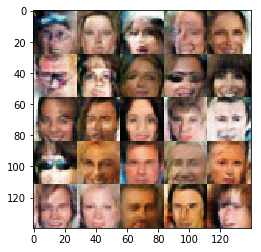

Epoch 1/1... Discriminator Loss: 1.4406... Generator Loss: 0.5112


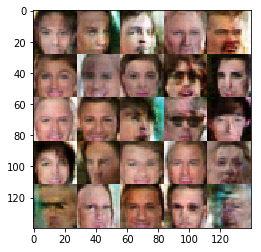

Epoch 1/1... Discriminator Loss: 1.4667... Generator Loss: 0.5549


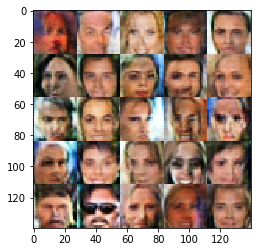

Epoch 1/1... Discriminator Loss: 1.6862... Generator Loss: 0.4174


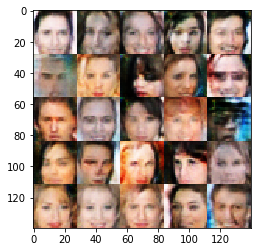

Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.5604


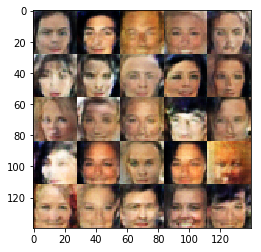

Epoch 1/1... Discriminator Loss: 1.5200... Generator Loss: 0.5288


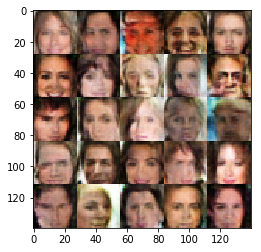

Epoch 1/1... Discriminator Loss: 1.3070... Generator Loss: 0.7442


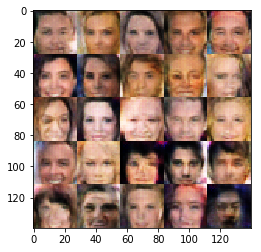

Epoch 1/1... Discriminator Loss: 1.3298... Generator Loss: 0.6123


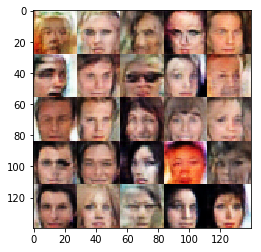

Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.5960


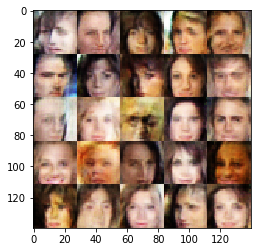

Epoch 1/1... Discriminator Loss: 1.4328... Generator Loss: 0.5635


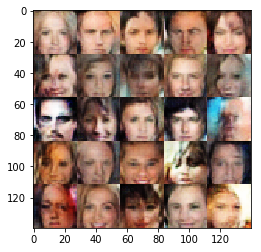

Epoch 1/1... Discriminator Loss: 1.2183... Generator Loss: 0.6037


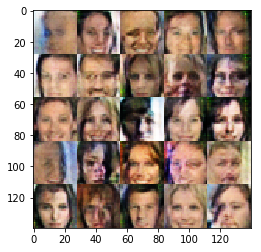

Epoch 1/1... Discriminator Loss: 1.5735... Generator Loss: 0.4741


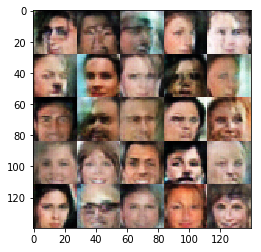

Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.6926


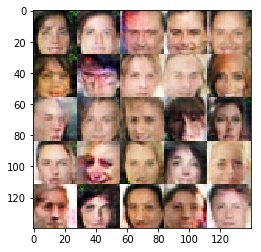

Epoch 1/1... Discriminator Loss: 1.3554... Generator Loss: 0.6072


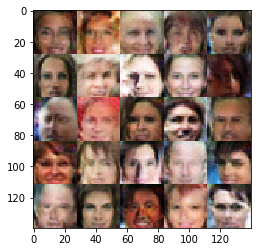

Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.5174


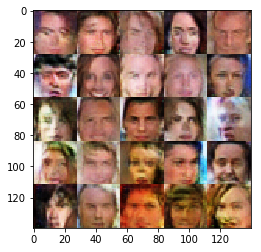

Epoch 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.6627


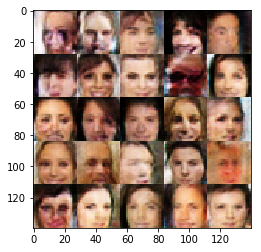

Epoch 1/1... Discriminator Loss: 1.4499... Generator Loss: 0.5604


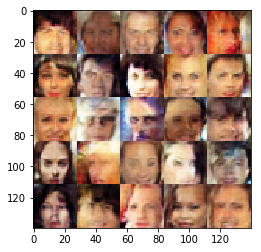

Epoch 1/1... Discriminator Loss: 1.5963... Generator Loss: 0.5074


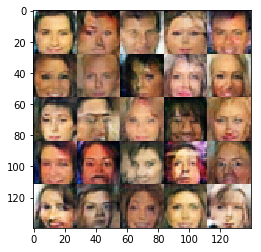

Epoch 1/1... Discriminator Loss: 1.4566... Generator Loss: 0.6114


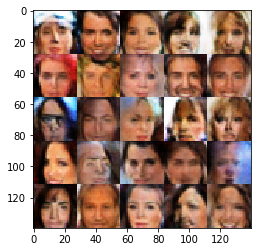

Epoch 1/1... Discriminator Loss: 1.5884... Generator Loss: 0.5197


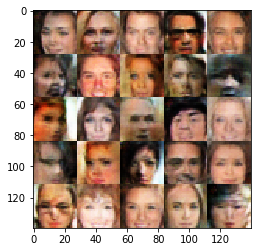

Epoch 1/1... Discriminator Loss: 1.4407... Generator Loss: 0.5561


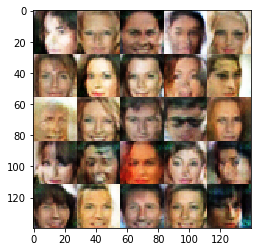

Epoch 1/1... Discriminator Loss: 1.3515... Generator Loss: 0.5933


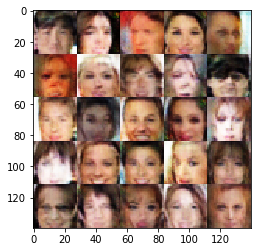

Epoch 1/1... Discriminator Loss: 1.4026... Generator Loss: 0.5802


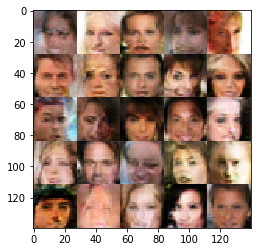

Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.6276


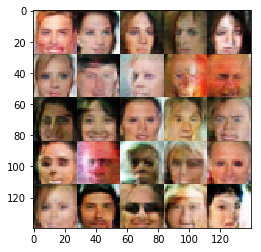

Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.5914


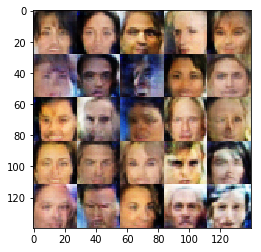

Epoch 1/1... Discriminator Loss: 1.1452... Generator Loss: 0.7182


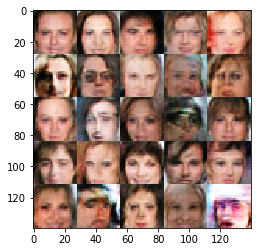

Epoch 1/1... Discriminator Loss: 1.4531... Generator Loss: 0.5535


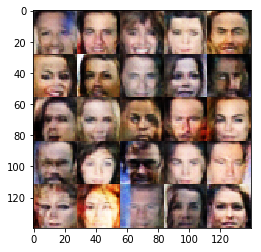

Epoch 1/1... Discriminator Loss: 1.4082... Generator Loss: 0.5730


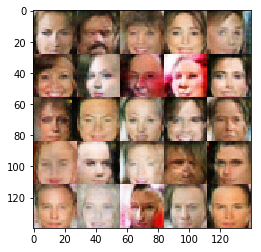

Epoch 1/1... Discriminator Loss: 1.4980... Generator Loss: 0.5517


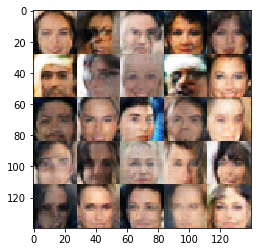

Epoch 1/1... Discriminator Loss: 1.5000... Generator Loss: 0.5193


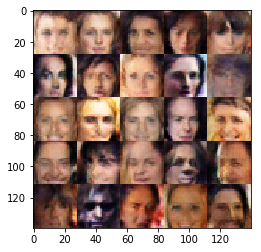

Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.5843


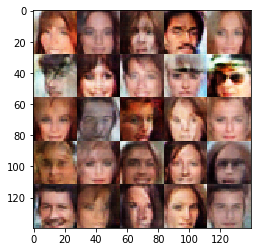

Epoch 1/1... Discriminator Loss: 1.4455... Generator Loss: 0.6147


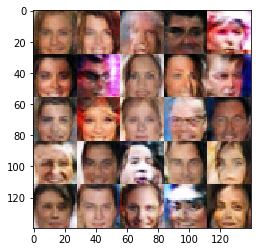

Epoch 1/1... Discriminator Loss: 1.4245... Generator Loss: 0.6164


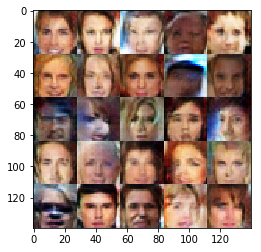

Epoch 1/1... Discriminator Loss: 1.2823... Generator Loss: 0.6649


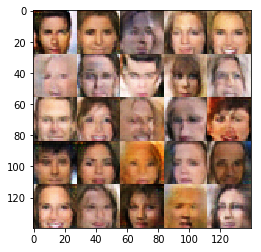

Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.6568


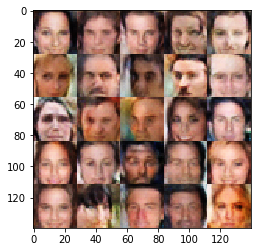

Epoch 1/1... Discriminator Loss: 1.4859... Generator Loss: 0.5656


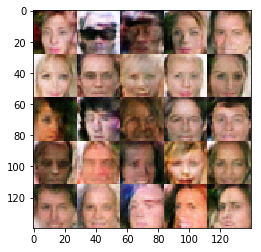

Epoch 1/1... Discriminator Loss: 1.4914... Generator Loss: 0.5443


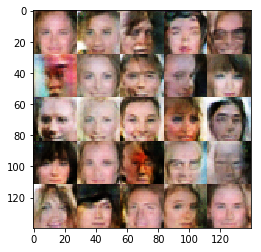

Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.6406


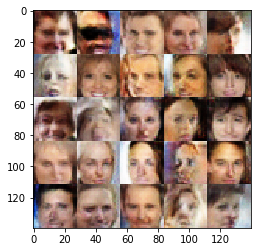

Epoch 1/1... Discriminator Loss: 1.4015... Generator Loss: 0.5722


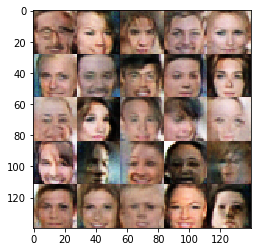

Epoch 1/1... Discriminator Loss: 1.3393... Generator Loss: 0.6231


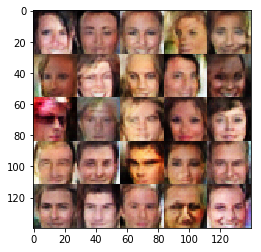

Epoch 1/1... Discriminator Loss: 1.3777... Generator Loss: 0.6069


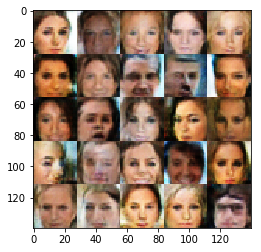

Epoch 1/1... Discriminator Loss: 1.2385... Generator Loss: 0.7009


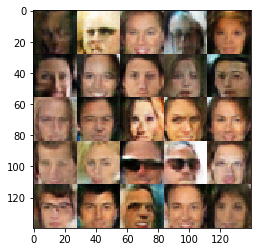

Epoch 1/1... Discriminator Loss: 1.5430... Generator Loss: 0.5185


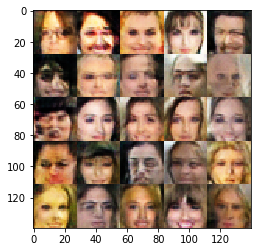

Epoch 1/1... Discriminator Loss: 1.4293... Generator Loss: 0.5631


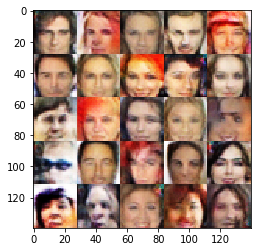

Epoch 1/1... Discriminator Loss: 1.5005... Generator Loss: 0.5550


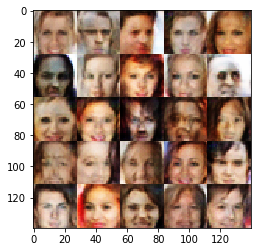

Epoch 1/1... Discriminator Loss: 1.4960... Generator Loss: 0.5162


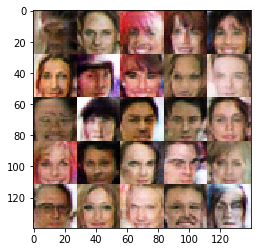

Epoch 1/1... Discriminator Loss: 1.4768... Generator Loss: 0.4771


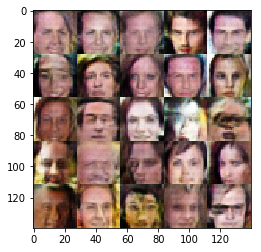

Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.5808


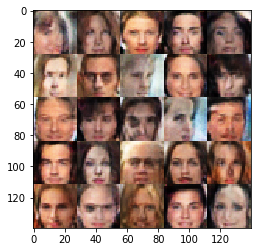

Epoch 1/1... Discriminator Loss: 1.4423... Generator Loss: 0.6381


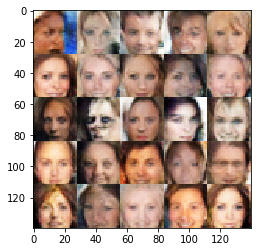

Epoch 1/1... Discriminator Loss: 1.4284... Generator Loss: 0.6585


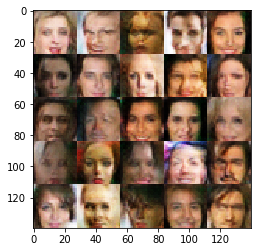

Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.5907


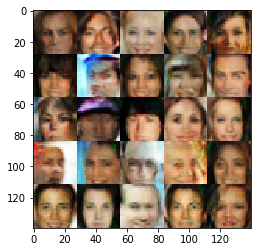

Epoch 1/1... Discriminator Loss: 1.4660... Generator Loss: 0.5960


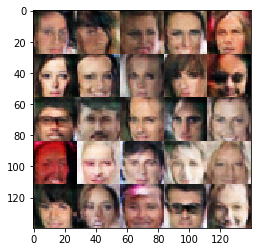

Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.6401


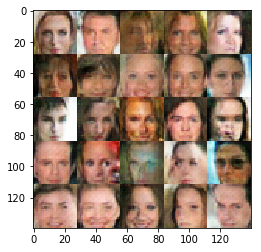

Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6160


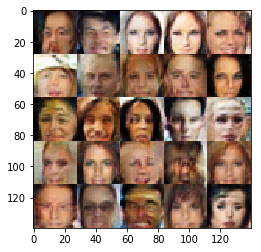

Epoch 1/1... Discriminator Loss: 1.3132... Generator Loss: 0.6061


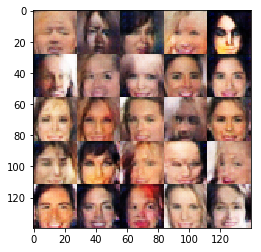

Epoch 1/1... Discriminator Loss: 1.5503... Generator Loss: 0.5788


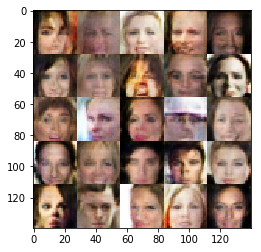

In [20]:
batch_size = 16
z_dim = 128
learning_rate = 0.0008
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.